<a href="https://colab.research.google.com/github/cyberone1812/CMUDeepLearning/blob/main/clean_fashion_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Generative Adversarial Networks

In [ ]:
import torch
import torch.nn as nn
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim
from torch.nn.functional import binary_cross_entropy_with_logits
from torchvision.transforms import Compose, ToTensor, Normalize

![](https://developers.google.com/static/machine-learning/gan/images/gan_diagram.svg)

In [ ]:
#transforms for data
transforms = Compose([ToTensor(),
                      Normalize((0.5,), (0.5,))])

In [ ]:
#load the data
train = torchvision.datasets.FashionMNIST(root = '.',
                                          download = True,
                                          transform=transforms)

In [ ]:
#train loader
trainloader = torch.utils.data.DataLoader(train, batch_size = 64)

In [ ]:
#grid of images
for img, labels in trainloader:
  grid = torchvision.utils.make_grid(img)
  break

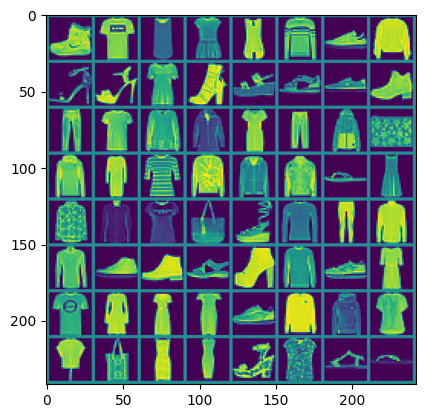

In [ ]:
#view the grid
plt.imshow(grid[0, :, :])

In [ ]:
#shapes?
for im, labels in trainloader:
  print(im.shape)
  print(labels.shape)
  break

torch.Size([64, 1, 28, 28])
torch.Size([64])


In [ ]:
#size of vector into generator
latent_dim = 128

In [ ]:
#GAN model
class GAN(nn.Module):
  def __init__(self, latent_dim = latent_dim, im_height = 28, im_width = 28, n_channels = 1):
    super().__init__()
    self.im_height = im_height
    self.im_width = im_width
    self.n_channels = n_channels


    self.generator = nn.Sequential(
        nn.Linear(latent_dim, 100),
        nn.ReLU(),
        nn.Linear(100, im_height*im_width*n_channels),
        nn.Tanh()
    )

    self.discriminator = nn.Sequential(
        nn.Flatten(),
        nn.Linear(im_width*im_height*n_channels, 100),
        nn.ReLU(),
        nn.Linear(100, 1)
        #nn.Sigmoid()
    )

  def gen_forward(self, x):
    x = torch.flatten(x, start_dim = 1)
    im = self.generator(x)
    im = im.view(x.size(0),
                 self.n_channels,
                 self.im_height,
                 self.im_width)
    return im

  def disc_forward(self, im):
    log_odds = self.discriminator(im)
    return log_odds



In [ ]:
#instantiate
model = GAN()

In [ ]:
#optimizers
generator_optimizer = optim.SGD(model.generator.parameters(), lr = 0.01)

discriminator_optimizer = optim.SGD(model.discriminator.parameters(), lr = 0.01)

In [ ]:
#loss function
loss_fn = binary_cross_entropy_with_logits

In [ ]:
#gpu
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
#noise for checking and list to hold generator
fixed_noise = torch.randn(64, latent_dim, 1, 1, device = device)
gen_images = []

In [ ]:
#move to gpu
model = model.to(device)

In [ ]:
#train 10 epochs
for epoch in range(10):
  for features, _ in trainloader:
    batch_size = features.size(0) #batch size
    features = features.to(device) #move ims to gpu

    #real images
    real_ims = features
    real_labels = torch.ones(batch_size, device = device)
    #fake images
    noise = torch.randn(batch_size, latent_dim, 1, 1, device = device)
    fake_images = model.gen_forward(noise)
    fake_labels = torch.zeros(batch_size, device = device)
    flipped_labels = real_labels

    #train discriminator
    discriminator_optimizer.zero_grad()
    disc_real_pred = model.disc_forward(real_ims).view(-1)
    real_loss = loss_fn(disc_real_pred, real_labels)

    disc_fake_pred = model.disc_forward(fake_images).view(-1)
    fake_loss = loss_fn(disc_fake_pred, fake_labels)

    disc_loss = .5*(real_loss + fake_loss)
    disc_loss.backward()
    discriminator_optimizer.step()

    generator_optimizer.zero_grad()
    discr_pred_fake = model.disc_forward(fake_images.detach()).view(-1)
    gen_loss = loss_fn(discr_pred_fake, flipped_labels)
    gen_loss.backward()
    generator_optimizer.step()

    with torch.no_grad():
      fake_images = model.gen_forward(fixed_noise)
      gen_images.append(torchvision.utils.make_grid(fake_images))

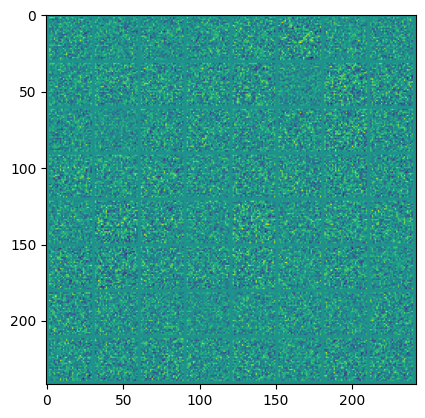

In [ ]:
#look at first generated images
plt.imshow(gen_images[0][0, :, :].cpu())

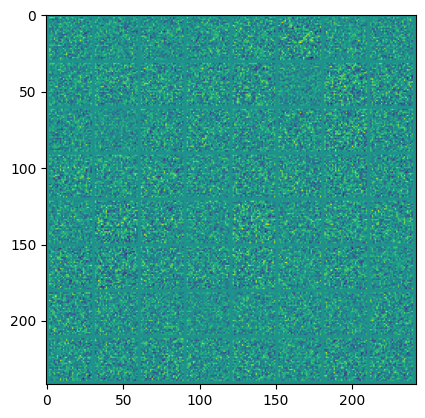

In [ ]:
#last iteration of generated images
plt.imshow(gen_images[-1][0, :, :].cpu())

#### Pretrained Models in `torch.hub`

In [ ]:
model = torch.hub.load('ndahlquist/pytorch-hub-stylegan:0.0.1', 'style_gan', pretrained=True)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ndahlquist/pytorch-hub-stylegan/zipball/0.0.1" to /root/.cache/torch/hub/0.0.1.zip
Downloading: "https://github.com/ndahlquist/lernapparat/releases/download/0.0.0/karras2019stylegan-ffhq-1024x1024.for_g_all-b418e00b3f4f99b879c3e805b8c55e.pt" to /root/.cache/torch/hub/checkpoints/karras2019stylegan-ffhq-1024x1024.for_g_a

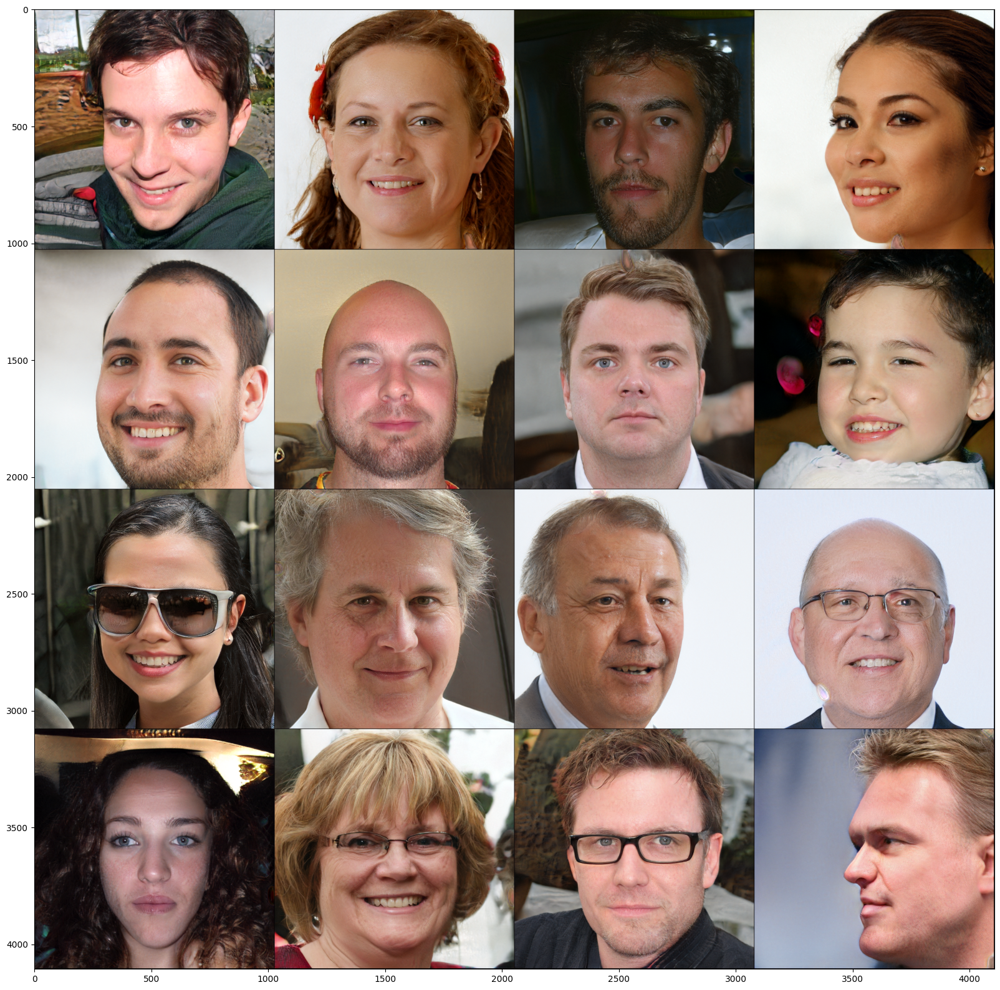

In [ ]:
model.eval()
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
model.to(device)

nb_rows = 4
nb_cols = 4
nb_samples = nb_rows * nb_cols
latents = torch.randn(nb_samples, 512, device=device)
with torch.no_grad():
    imgs = model(latents)
    # normalization to 0..1 range
    imgs = (imgs.clamp(-1, 1) + 1) / 2.0
imgs = imgs.cpu()

imgs = torchvision.utils.make_grid(imgs, nrow=nb_cols)

plt.figure(figsize=(20, 20))
plt.imshow(imgs.permute(1, 2, 0).detach().numpy())

In [ ]:
from transformers import pipeline

In [ ]:
# pipe = pipeline(taks = 'text-to-video')

#### Streaming Audio

In [ ]:
from torchaudio.io import StreamReader
from IPython.display import Audio

In [ ]:
url = 'https://www.soundhelix.com/examples/mp3/SoundHelix-Song-1.mp3'

In [ ]:
Audio(url)

In [ ]:
reader = StreamReader(src = url)

In [ ]:
reader.get_src_stream_info(0)

SourceAudioStream(media_type='audio', codec='mp3', codec_long_name='MP3 (MPEG audio layer 3)', format='fltp', bit_rate=192000, num_frames=0, bits_per_sample=0, metadata={}, sample_rate=44100.0, num_channels=2)

In [ ]:
reader.add_basic_audio_stream(
    frames_per_chunk=4000,
)

In [ ]:
for i in range(reader.num_out_streams):
  print(reader.get_out_stream_info(i))

OutputAudioStream(source_index=0, filter_description='aformat=sample_fmts=fltp', media_type='audio', format='fltp', sample_rate=44100.0, num_channels=2)


In [ ]:
n_ite = 1
waveforms = []
for chunk in reader.stream():
  waveforms.append(chunk)

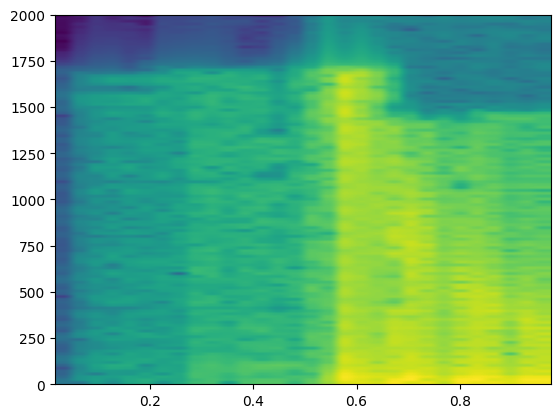

In [ ]:
plt.specgram(waveforms[0][0][:, 0], Fs = 4000);

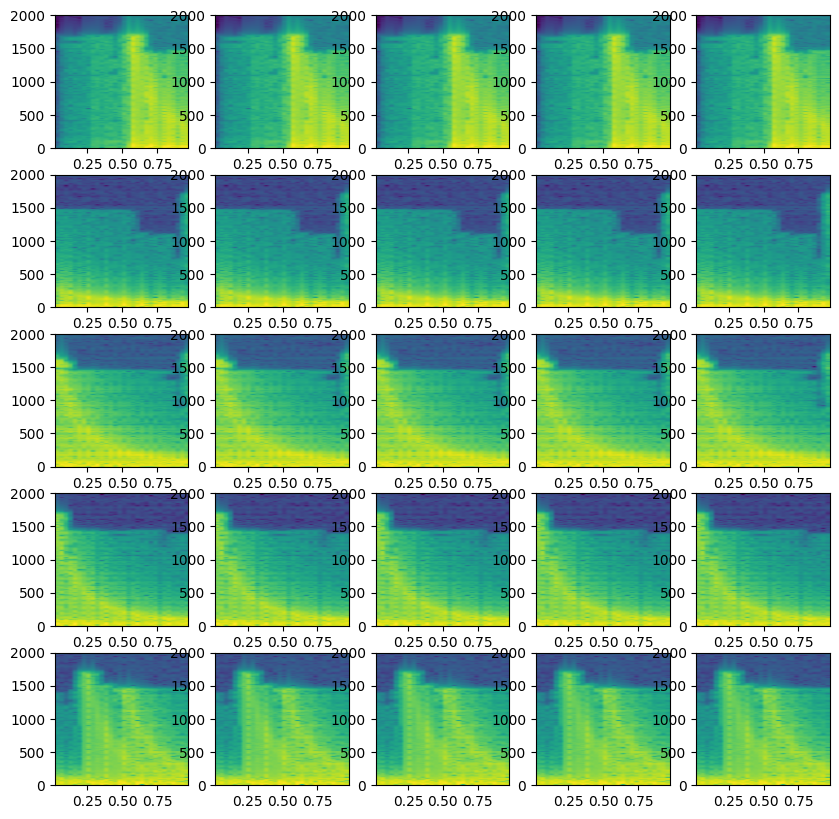

In [ ]:
fig, ax = plt.subplots(5, 5, figsize = (10, 10))
for i in range(5):
  for j in range(5):
    ax[i, j].specgram(waveforms[i][0][:, 0], Fs = 4000)

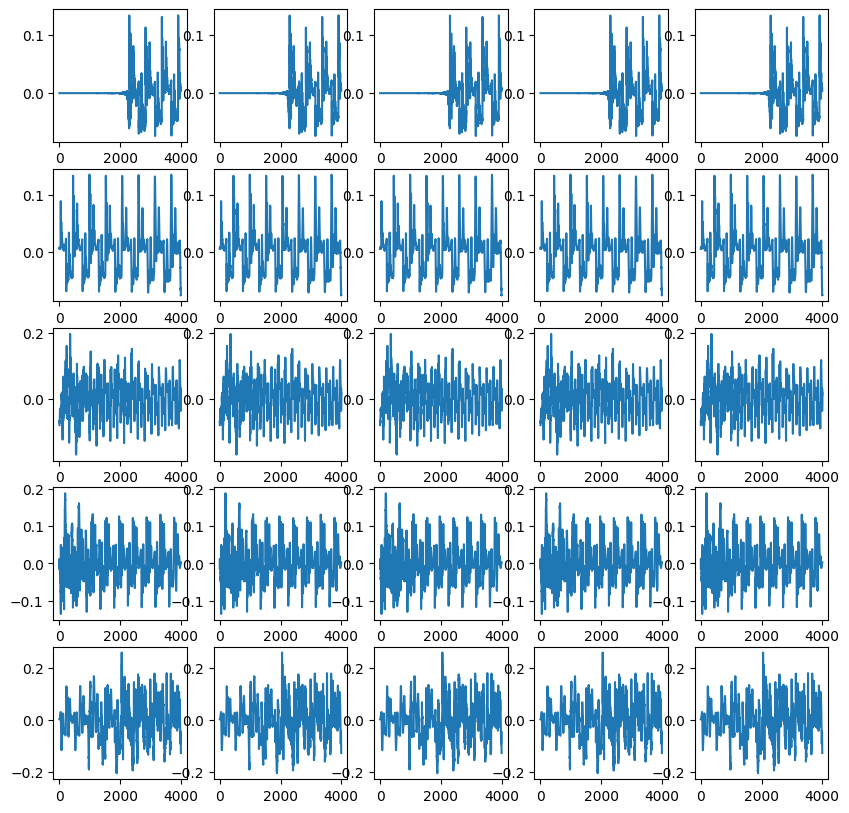

In [ ]:
fig, ax = plt.subplots(5, 5, figsize = (10, 10))
for i in range(5):
  for j in range(5):
    ax[i, j].plot(waveforms[i][0][:, 0])